<a href="https://colab.research.google.com/github/max-elliott/AmpSimulationPytorch/blob/main/GuitarAmp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---
# **Guitar Ampilfier Simulation using Deep Learning by Max Elliott**
---
This work based off of https://github.com/GuitarML/GuitarLSTM, which is a Tensorflow implementation of work done in https://www.mdpi.com/2076-3417/10/3/766/htm.
I have effectively re-implemented parts of the repository above using Pytorch within this notebook. However the model architecture, hyperparameter tunings etc. have varied based on my experimention. Following through this notebook will train a neural network (CNN into LSTM layers) to act as a guitar amplifier, converting an input audio sequence into the amplified version. The model works in the raw audio domain, here at 44.1kHz. The sound that the model is aiming to replicate is an aggressive distorted preset for bass guitar recorded with https://neuraldsp.com/plugins/parallax. Enjoy!

---
# 1) Utility Functions and Model Classes
---
Please run these cells whether you are using the pretrained example model or if you're running the full training loop, as the testing section relies on the functionality off these cells

IF USING PRETRAINED MODEL, SET THE FLAG BELOW TO TRUE. THIS WILL DISABLE THE TRAINING LOOP AND LOAD A PRETRAINED MODEL IN THE TESTING SECTION (SECTION 4).

In [ ]:
USE_PRETRAINED_MODEL = False

Import deep learning libraries and numpy

In [ ]:
import torch
import tensorflow
import numpy as np
import torch.nn as nn
from torch.nn.functional import leaky_relu as lRelu
from torch import tanh
import sys
print(tensorflow.__version__, torch.__version__, np.__version__, sys.version)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)

random_state = 42

class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

2.5.0 1.9.0+cu102 1.19.5 3.7.10 (default, May  3 2021, 02:48:31) 
[GCC 7.5.0]
cuda


Declare some simple utility functions

In [ ]:
from scipy.io import wavfile
import zipfile

def save_wav(name, data):
    wavfile.write(name, 44100, data.flatten().astype(np.float32))

def unzip_zipfile(zip_file, output_dir):
    
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(output_dir)

Utility functions for creating our datasets

In [ ]:
import librosa
!pip install wavio
import wavio
from torch.utils.data import Dataset, DataLoader
print(librosa.__version__)

def normalise(list_of_data):
    max_value = np.max([np.max(x) for x in list_of_data])
    min_value = np.min([np.min(x) for x in list_of_data])
    # abs_max = np.abs(max_value)
    # abs_min = np.abs(min_value)
    divisor = np.max([np.abs(max_value),np.abs(min_value)])
    return [wav / divisor for wav in list_of_data]

def generate_wav_data(list_of_wav_files, audio_length=2048, sr=44100, mono=True, format='float32'):
    # list_of_wav_files = []
    
    list_of_cropped_wav_data = []

    for wav_file in list_of_wav_files:
        if format == 'float32':  # Using float32 wav
            wav_data, _ = librosa.load(wav_file, mono=mono, sr=sr)
        else: # integer bit depth, not entirely tested
            with open(wav_file, 'rb') as f:
                wav = wavio.read(f)

            wav_data = wav.data.astype(np.float32) / (np.power(2, wav.sampwidth * 8))
        # print(f'wav length in samples = {wav_data.shape}')
        num_splits = len(wav_data) // audio_length
        split_data = np.split(wav_data[:num_splits * audio_length], num_splits)
        list_of_cropped_wav_data += split_data

    list_of_cropped_wav_data = normalise(list_of_cropped_wav_data)
    list_of_cropped_wav_tensors = [torch.from_numpy(wav) for wav in list_of_cropped_wav_data]

    return list_of_cropped_wav_tensors

class AmpDataset(Dataset):
    def __init__(self, input_wavs, target_wavs):
        super(Dataset, self).__init__()
        self.inputs = input_wavs
        self.targets = target_wavs

    def __getitem__(self, i):
        return self.inputs[i], self.targets[i]

    def __len__(self):
        return len(self.inputs)

0.8.1


Defining a loss function for our model to be trained with.

In [ ]:
# Used in original paper but not here
def pre_emphasis_filter(x, coeff=0.95):
    return torch.cat([x, x - coeff * x], 1)
    
def error_to_signal_loss(y_pred, y_true, reduction='mean'): 
    """
    Error to signal ratio with pre-emphasis filter:
    """
    # y_true, y_pred = pre_emphasis_filter(y_true), pre_emphasis_filter(y_pred)
    l = torch.sum(torch.pow(y_true - y_pred, 2), axis=1) / torch.sum(torch.pow(y_true, 2), axis=1) + 1e-10
    if reduction == 'mean':
        l = torch.mean(l)
    return l

**The neural network to be trained.**
Consists of multiple layers of convolutions into batch normalisation. These effectively work as feature extraction layers from the raw audio data. After that there are a number of LSTM layers that take the extracted features and temporally predict the output features. These are passed through a linear layer to produce a single output sample for each input sample.

In [ ]:
class AmpSimulation(nn.Module):

    def __init__(self, **kwargs):
        super(AmpSimulation, self).__init__()
        
        self.num_conv_channels = kwargs.get('num_features', 16)
        self.rnn_hidden_size = kwargs.get('hidden_size', 32)
        self.rnn_num_layers = kwargs.get('rnn_num_layers', 1)

        self.conv1 = nn.Conv1d(1, self.num_conv_channels, 3, padding=1)  # expects (N, L) -> (N, L, C)
        self.bn1 = nn.BatchNorm1d(self.num_conv_channels)
        self.conv2 = nn.Conv1d(self.num_conv_channels, self.num_conv_channels, 3, padding=1)  # expects (N, L, C) -> (N, L, C)
        self.bn2 = nn.BatchNorm1d(self.num_conv_channels)
        self.conv3 = nn.Conv1d(self.num_conv_channels, self.num_conv_channels, 3, padding=1)  # expects (N, L, C) -> (N, L, C)
        self.bn3 = nn.BatchNorm1d(self.num_conv_channels)
        self.rnn = nn.LSTM(self.num_conv_channels, self.rnn_hidden_size, num_layers=self.rnn_num_layers, batch_first=True)  # expects (N, L, C), (N, 1, H) -> (N, L, H), (N, 1, H)
        self.linear = nn.Linear(self.rnn_hidden_size, 1)  # expects (N, L, H) -> (N, L(, 1))

    def forward(self, x):
        batch_size = x.shape[0]
        y = torch.unsqueeze(x, 1)
        # print(y.shape)
        y = tanh(self.bn1(self.conv1(y)))
        y = tanh(self.bn2(self.conv2(y)))
        # print(y.shape)
        # y = tanh(self.bn3(self.conv3(y)))
        # print(y.shape)
        y_packed = torch.swapaxes(y, 1, 2) # pack
        # print(y_packed.shape)
        # hidden = 0 # initialise hidden states
        y_packed, hidden = self.rnn(y_packed)
        # y = lRelu(y_packed) # unpack
        y = y_packed
        # print(y.shape)
        y = self.linear(y)
        # print(y.shape)
        y = torch.squeeze(y)
        # y = tanh(y)
        # print(y.shape)
        y = y + x
        # print(y.shape)

        return y

# test_tensor = torch.rand(5, 12)
# model = AmpSimulation()
# out = model(test_tensor)
# print(out.shape)

Converter, used to generate samples using a trained model.

In [ ]:
class Converter:

    def __init__(self, audio_data_tensor, save_dir):
        self.data = audio_data_tensor
        self.save_dir = save_dir
        os.makedirs(self.save_dir, exist_ok=True)

        for i in range(self.data.shape[0]):
            ground_truth_filename = os.path.join(save_dir, f'target_{i}.wav')
            save_wav(ground_truth_filename, self.data[i].numpy())

    def convert(self, model, model_name):
        model_dir = os.path.join(self.save_dir, model_name)
        os.makedirs(model_dir, exist_ok=True)

        with torch.no_grad():

            converted = model(self.data.to(device=next(model.parameters()).device)).cpu()
            for i in range(converted.shape[0]):
                output_filename = os.path.join(model_dir, f'converted_{i}.wav')
                save_wav(output_filename, converted[i].numpy())


In [ ]:
def save_model(model, config, filepath):
    print(filepath)
    os.makedirs(os.path.dirname(filepath), exist_ok=True)
    torch.save({
        'model_state_dict': model.state_dict(),
        'config': config
        },
         filepath)
    
def load_model(filepath):
    return torch.load(filepath)

**Main training and validation loop**

In [ ]:
import torch.optim as optim
# from logger import Logger

class Tester():

    def __init__(self, converter=None):
        self.best_loss = 9999999999
        self.converter = converter

    def test_loop(self, model, test_dataloader, **kwargs):
        
        test_device = kwargs.get('device', torch.device('cpu'))
        criterion = error_to_signal_loss

        with torch.no_grad():

            running_loss = 0

            for i, data in enumerate(test_dataloader, 0):

                inputs, targets = data

                inputs = inputs.to(device=test_device)
                outputs = model(inputs)
                loss = criterion(outputs.cpu(), targets)

                running_loss += loss.item() * len(inputs)

            # print(len(test_dataloader.dataset))
            avg_loss = running_loss / len(test_dataloader.dataset)
            
            loss_string = 'Test loss: %.5f' % avg_loss
            loss_string = color.RED + loss_string + color.END if avg_loss < self.best_loss else loss_string
            print(loss_string)

            if avg_loss < self.best_loss and self.converter is not None:
                model_name = kwargs.get("model_name", 'No name')
                print(f'Running conversion for {model_name}')
                converter.convert(model, model_name=model_name)

            self.best_loss = avg_loss if avg_loss < self.best_loss else self.best_loss

        return avg_loss

def training_loop(model, training_input_data, validation_input_data, training_target_data, validation_target_data, tester, model_config, device=torch.device("cpu"), **kwargs):

    # log_writer = Logger("./logs", model_name if model_name is not None else 'noname')
    best_loss = 9999999999

    learning_rate = kwargs.get('learning_rate', 0.001)
    epochs = kwargs.get('epochs', 100)
    mini_batch_size = kwargs.get('mini_batch_size', 100)
    model_save_dir = kwargs.get('model_save_dir', './best_models')
    model_name = kwargs.get('model_name', 'model')

    train_dataset = AmpDataset(training_input_data, training_target_data)
    test_dataset = AmpDataset(validation_input_data, validation_target_data)

    trainloader = DataLoader(train_dataset, batch_size=mini_batch_size, shuffle=True)
    testloader = DataLoader(test_dataset, batch_size=mini_batch_size, shuffle=True)

    criterion = error_to_signal_loss
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, betas=(0.5, 0.999))
    # optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.5)

    print(f'%%%%%%%%%%%%%%%%%%%% Starting training of {model_name} %%%%%%%%%%%%%%%%%%%%')

    for epoch in range(epochs):

        running_loss = 0.0
        for i, data in enumerate(trainloader, 0):

            # get the inputs; data is a tuple of [inputs, targets]
            
            inputs, targets = data
            # print(len(inputs))
            inputs = inputs.to(device=torch.device('cuda'))
            # print(inputs.shape, labels.shape)

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = model(inputs)
            loss = criterion(outputs.cpu(), targets)
            loss.backward()
            optimizer.step()

            # print statistics
            running_loss += loss.item() * len(inputs)

        avg_running_loss = running_loss / len(trainloader.dataset)
        if (epoch + 1) % 1 == 0:
            print('[%d] loss: %.5f' % (epoch + 1, avg_running_loss))
            test_model_name = f'{model_name}_epoch={epoch}'
            test_loss = tester.test_loop(model, testloader, model_name=test_model_name, device=torch.device('cuda'))

            if test_loss < best_loss:
                best_loss = test_loss
                model.to(device=torch.device('cpu'))
                model_filepath = os.path.join(model_save_dir, model_name + '.pth')
                save_model(model, model_config, model_filepath)
                model.to(device=torch.device('cuda'))
            # log_writer.scalar_summary("test_loss", test_loss.item(), epoch)
            # log_writer.scalar_summary("test_accuracy", test_acc, epoch)

        # log_writer.scalar_summary("train_loss", running_loss, epoch)
        running_loss = 0.0



    print('Finished Training')


---
# **2) Dataset Downloading and Training**
---

**Download Dataset**

This is a custom dataset I made by recording myself playing bass through Reaper, saving the signal before going through the amp plugin (for the input data) and after the plugin (for the target data). It consists of roughly 7 minutes of training data and 1 minute of testing data. I tried to playing repeated phrases when reocrding to keep the dataset as varied as possible. It features finger-picked, palm-muted, and slapped playing, again for variety.

In [ ]:
import os

zipped_data = './larger_bass_dataset.zip'
unzipped_data = './larger_bass_dataset'

if not os.path.exists(zipped_data):
    !gdown --id '1u5O2GyDJ6Zc_AaifWlL7boF-dmNIhfMe'


unzip_zipfile(zipped_data, unzipped_data)

Downloading...
From: https://drive.google.com/uc?id=1u5O2GyDJ6Zc_AaifWlL7boF-dmNIhfMe
To: /content/larger_bass_dataset.zip
152MB [00:04, 37.3MB/s]


---
# **3) Main Creation of datasets and model training**
---
No need to run if you just want to try the pre-trained model. Skip to (4) if this is the case.

In [ ]:
from sklearn.model_selection import train_test_split

if not USE_PRETRAINED_MODEL:

    training_input_files = [os.path.join(unzipped_data, 'training/training_input.wav')]
    training_target_files = [os.path.join(unzipped_data, 'training/training_target.wav')]

    training_sample_length = 4096
    wav_format = 'float32'
    training_input_data = generate_wav_data(training_input_files, audio_length=training_sample_length, mono=True, format=wav_format)
    training_target_data = generate_wav_data(training_target_files, audio_length=training_sample_length, mono=True,format=wav_format)

    validation_split = 0.2
    training_input_data, validation_input_data, training_target_data, validation_target_data = train_test_split(training_input_data, training_target_data, test_size=validation_split, random_state=random_state)

    print(len(training_input_data))
    print(len(training_target_data))
    print(training_input_data[0].shape)
    print(training_target_data[0].shape)

    loss = error_to_signal_loss(training_input_data[0].unsqueeze(0), training_target_data[0].unsqueeze(0))

    validation_conversion_input_batch = torch.cat([validation_input_data[i].unsqueeze(0) for i in range(0, len(validation_input_data), 100)], axis=0)
    validation_conversion_target_batch = torch.cat([validation_target_data[i].unsqueeze(0) for i in range(0, len(validation_target_data), 100)], axis=0)

    converted_dir = './converted_validation'
    converter = Converter(validation_conversion_input_batch, converted_dir)

    model_config = {
        'cnn_num_layers': 3,
        'rnn_num_layers': 2,
        'num_features': 64, # 64
        'hidden_size': 64 # 64
    }

    training_config = {
        'learning_rate': 0.005,
        'epochs': 2000,
        'mini_batch_size': 128,
        'model_save_dir': './best_models',
        'model_name': 'test3_2000epochs'
    }

    model = AmpSimulation(**model_config)
    model = model.to(device)
    model.train()

    training_loop(model, training_input_data, validation_input_data, training_target_data, validation_target_data, Tester(converter=converter), model_config, **training_config)
else:
    print("Using pre-trained model, ignoring training loop.")

3919
3919
torch.Size([4096])
torch.Size([4096])
%%%%%%%%%%%%%%%%%%%% Starting training of test3_2000epochs %%%%%%%%%%%%%%%%%%%%
[1] loss: 1.29955
Test loss: 1.00338
Running conversion for test3_2000epochs_epoch=0
./best_models/test3_2000epochs.pth
[2] loss: 1.04903
Test loss: 1.05402
[3] loss: 0.96206
Test loss: 1.01456
[4] loss: 0.93372
Test loss: 0.92671
Running conversion for test3_2000epochs_epoch=3
./best_models/test3_2000epochs.pth
[5] loss: 0.89979
Test loss: 0.85448
Running conversion for test3_2000epochs_epoch=4
./best_models/test3_2000epochs.pth
[6] loss: 0.88935
Test loss: 0.84362
Running conversion for test3_2000epochs_epoch=5
./best_models/test3_2000epochs.pth
[7] loss: 0.85043
Test loss: 0.84365
[8] loss: 0.86583
Test loss: 0.83687
Running conversion for test3_2000epochs_epoch=7
./best_models/test3_2000epochs.pth
[9] loss: 0.84677
Test loss: 0.82826
Running conversion for test3_2000epochs_epoch=8
./best_models/test3_2000epochs.pth
[10] loss: 0.82687
Test loss: 0.81062
Run

---
# **4) Testing the Trained Model**
---

This section takes a trained model (either the pre-trained model supplied or model trained in section 2) and uses it to convert the test set. The test loss is calculated and audio samples are shown. 

In [ ]:
if USE_PRETRAINED_MODEL:
    # download pretrained model
    model_local_filepath = './test2_2000epochs.pth'   # Change this for different example models
    example_models = {
        './bass_example1.pth': '1SoEQ8bfgn8ZeYfMG_tw8Ce9FVdpe83t5',
        './test2_2000epochs.pth': '1uRuTvOhZ08Eb9IzVAziesbllGP-2pJ9p'
        }
    if model_local_filepath == './bass_example1.pth':
        !gdown --id 1SoEQ8bfgn8ZeYfMG_tw8Ce9FVdpe83t5
    elif model_local_filepath == './test2_2000epochs.pth':
        !gdown --id 1uRuTvOhZ08Eb9IzVAziesbllGP-2pJ9p
else:
    model_local_filepath = os.path.join(training_config['model_save_dir'], training_config['model_name'] + '.pth')

model_data = load_model(model_local_filepath)
testing_model = AmpSimulation(**model_data['config'])
testing_model.load_state_dict(model_data['model_state_dict'])
testing_model.cpu()
# print(f"Testing model {model_data['config']['model_name']} with parameters:")
print(model_data['config'])

Downloading...
From: https://drive.google.com/uc?id=1uRuTvOhZ08Eb9IzVAziesbllGP-2pJ9p
To: /content/test2_2000epochs.pth
100% 361k/361k [00:00<00:00, 23.5MB/s]
{'cnn_num_layers': 2, 'rnn_num_layers': 1, 'num_features': 64, 'hidden_size': 96}


**Load/Process the test set and measure loss**

The test set is an entirely separate dataset also recorded by me.

In [ ]:
test_input_file = [os.path.join(unzipped_data, 'test/test_input.wav')]
test_target_file = [os.path.join(unzipped_data, 'test/test_target.wav')]

test_sample_length = 44100 * 10
wav_format = 'float32'
test_input_data = generate_wav_data(test_input_file, audio_length=test_sample_length, mono=True, format=wav_format)
test_target_data = generate_wav_data(test_target_file, audio_length=test_sample_length, mono=True,format=wav_format)

test_conversion_dir = './test_set'
os.makedirs(test_conversion_dir, exist_ok=True)

for i in range(len(test_input_data)):
    output_filename = os.path.join(test_conversion_dir, f'input_{i}.wav')
    save_wav(output_filename, test_input_data[i].numpy())
for i in range(len(test_target_data)):
    output_filename = os.path.join(test_conversion_dir, f'target_{i}.wav')
    save_wav(output_filename, test_target_data[i].numpy())

with torch.no_grad():

    pre_converted = torch.cat([d.unsqueeze(0) for d in test_input_data], axis=0)
    converted = testing_model(pre_converted.to(device=torch.device('cpu'))).cpu()
    for i in range(converted.shape[0]):
        output_filename = os.path.join(test_conversion_dir, f'converted_{i}.wav')
        save_wav(output_filename, converted[i].numpy())

    test_dataset = AmpDataset(test_input_data, test_target_data)
    testloader = DataLoader(test_dataset, batch_size=64, shuffle=True)

    test_loss = Tester().test_loop(testing_model, testloader, device=torch.device('cpu'))
    print(f"Final average test set loss (using error to signal loss) is {test_loss}.")

Test loss: 0.09492
Final average test set loss (using error to signal loss) is 0.09492414444684982.


**Play test set examples**

Below will create 3-tuples of playable audio files: the first is the source (input) audio, the second is the target (output) audio, and the third is the model prediction of the target given the source.

In general we can hear that the model gets elements of the distorted sound correct, and retains the notes and melodies played in the source. It fails to capture the full high frequency content of the output signal however.

In [ ]:
from IPython.display import Audio, display

def display_audio_example(input_sample, target_sample, predicted_sample, sample_name):
    print(f'Sample {sample_name} input')
    display(Audio(data=input_sample, rate=44100))
    print(f'Sample {sample_name} target')
    display(Audio(data=target_sample, rate=44100))
    print(f'Sample {sample_name} prediction')
    display(Audio(data=predicted_sample, rate=44100))

print("------- EXAMPLE SOUND FILES -------")

for sample_idx in range(len(test_input_data)):
    display_audio_example(test_input_data[sample_idx], test_target_data[sample_idx], converted[sample_idx], sample_idx)


------- EXAMPLE SOUND FILES -------
Sample 0 input


Sample 0 target


Sample 0 prediction


Sample 1 input


Sample 1 target


Sample 1 prediction


Sample 2 input


Sample 2 target


Sample 2 prediction


Sample 3 input


Sample 3 target


Sample 3 prediction


Sample 4 input


Sample 4 target


Sample 4 prediction


**Show example waveforms**

Here we plot random segments of the input, target and predicted waveforms. We can see that the general shape of the target and predicted waveforms are very similar, showing the lower frequency content is very well modeled. The smaller high frequency variations are definitely smoothed in the prediction compared to the target however, which verifies the differences in sound that were heard above.

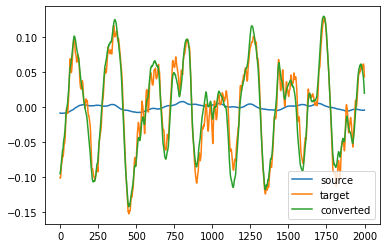

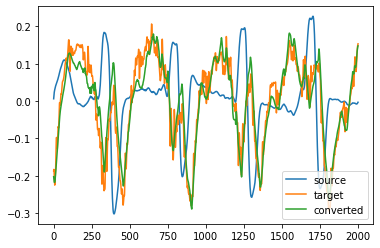

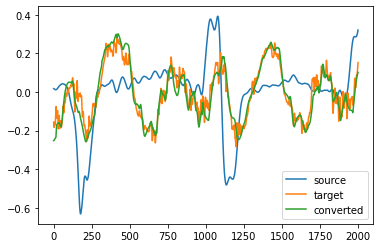

In [ ]:
from matplotlib import pyplot as plt

for sample_idx in range(3):
    num_samples = 2000
    start_sample = 20000
    x_axis = list(range(num_samples))
    plt.plot(test_input_data[sample_idx][start_sample:start_sample+num_samples], label='source')
    plt.plot(test_target_data[sample_idx][start_sample:start_sample+num_samples], label='target')
    plt.plot(converted[sample_idx][start_sample:start_sample+num_samples], label='predicted')
    # display_audio_example(test_input_data[sample_idx], test_target_data[sample_idx], converted[sample_idx], sample_idx)
    plt.legend()
    plt.show()
